In [7]:
from bonelab.util.aim_calibration_header import get_aim_density_equation
from vtkbone import vtkboneAIMReader
from enum import Enum
from matplotlib import pyplot as plt
import numpy as np
import pyvista as pv
import os

In [2]:
pv.set_jupyter_backend('panel')

In [3]:
image_name = "NORMXTII_0057_TL" # "NORM_XTII_0051_TL"
image_dir = "/Users/nathanneeteson/Documents/Data/Images/UNet"
preds_dir = "/Users/nathanneeteson/Documents/Data/Images/UNet/predictions"

In [4]:
# create an ImageType Enum with two options: density image or mask
ImageType = Enum("ImageType", "DENSITY MASK")

# define function for reading in images
def read_image_to_pyvista(reader: vtkboneAIMReader, filename: str, image_type: ImageType) -> pv.UniformGrid:
    reader.SetFileName(filename)
    reader.Update()
    grid = pv.UniformGrid(reader.GetOutput())
    if image_type is ImageType.DENSITY:
        # convert data to densities
        m, b = get_aim_density_equation(reader.GetProcessingLog())
        grid["AIMData"] = m * grid["AIMData"] + b
    elif image_type is ImageType.MASK:
        # convert data to booleans
        grid["AIMData"] = grid["AIMData"] > 0
    return grid

In [5]:
# read in data

reader = vtkboneAIMReader()
reader.DataOnCellsOff()

img = read_image_to_pyvista(reader, os.path.join(image_dir, f"{image_name}.AIM"), ImageType.DENSITY)

cort_ref = read_image_to_pyvista(reader, os.path.join(image_dir, f"{image_name}_CORT_MASK.AIM"), ImageType.MASK)
trab_ref = read_image_to_pyvista(reader, os.path.join(image_dir, f"{image_name}_TRAB_MASK.AIM"), ImageType.MASK)

cort_pred = read_image_to_pyvista(reader, os.path.join(preds_dir, f"{image_name}_CORT_MASK.AIM"), ImageType.MASK)
trab_pred = read_image_to_pyvista(reader, os.path.join(preds_dir, f"{image_name}_TRAB_MASK.AIM"), ImageType.MASK)

In [6]:
plotter = pv.Plotter(
    notebook=True, 
    window_size=(600,600),
    shape=(2,2)
)

plotter.subplot(0,0)
plotter.add_mesh(
    img.slice_orthogonal(),
    cmap = "gist_gray"
)

plotter.subplot(0,1)
plotter.add_mesh(img.outline())

plotter.link_views()

plotter.show()

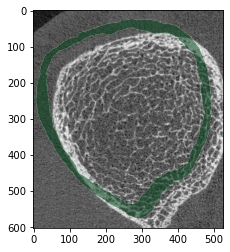

<Figure size 432x288 with 0 Axes>

In [17]:
# Figure 1 (full view and zoom in)

slice_num = 168//2

image_slice = img.point_data["AIMData"].reshape(img.dimensions, order="F")[:,:,slice_num]
cort_slice = cort_ref.point_data["AIMData"].reshape(cort_ref.dimensions, order="F")[:,:,slice_num]
trab_slice = trab_ref.point_data["AIMData"].reshape(trab_ref.dimensions, order="F")[:,:,slice_num]

plt.figure()

plt.imshow(image_slice, cmap="Greys_r")
plt.imshow(cort_slice, cmap="Greens", alpha=0.5*(cort_slice>0))


plt.figure()


plt.show()

In [10]:
img.point_data

pyvista DataSetAttributes
Association     : POINT
Active Scalars  : AIMData
Active Vectors  : None
Active Texture  : None
Active Normals  : None
Contains arrays :
    AIMData                 float64  (71531712,)          SCALARS